In [1]:
import matplotlib.pyplot as pltimport
import xhermes as xh
from boutdata.data import BoutData
from boutdata import collect
import matplotlib.pyplot as plt
import glob     
import re
import numpy as np
import pandas as pd
from heatflux_functions import *
from data_accessors import *
import xarray as xr
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 15



# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})


def replace_guards(var):
    """
	This in-place replaces the points in the guard cells with the points on the boundary
    
    """
    # Strip the edge guard cells
    var = var[1:-1]

    var[0] = 0.5*(var[0] + var[1])
    var[-1] = 0.5*(var[-1] + var[-2])
    return var

In [2]:
ds = pd.read_pickle('/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/flux_limit/Flux_limiter_detachment_ITER_final.pickle')

colors = {
    'SH': '#E24A33',
    '0.2': '#348ABD',
    '0.1': '#988ED5',
    '0.06': 'grey',
    '0.3': '#777777',
    '0.4': '#FBC15E',
    'SNB': 'magenta'
}


print(ds['neon_frac'].unique())
# FFB5B8

[0.    0.002 0.004 0.006 0.008 0.01  0.02  0.03  0.04  0.05  0.06  0.07
 0.08  0.09  0.1  ]


# No neon profiles

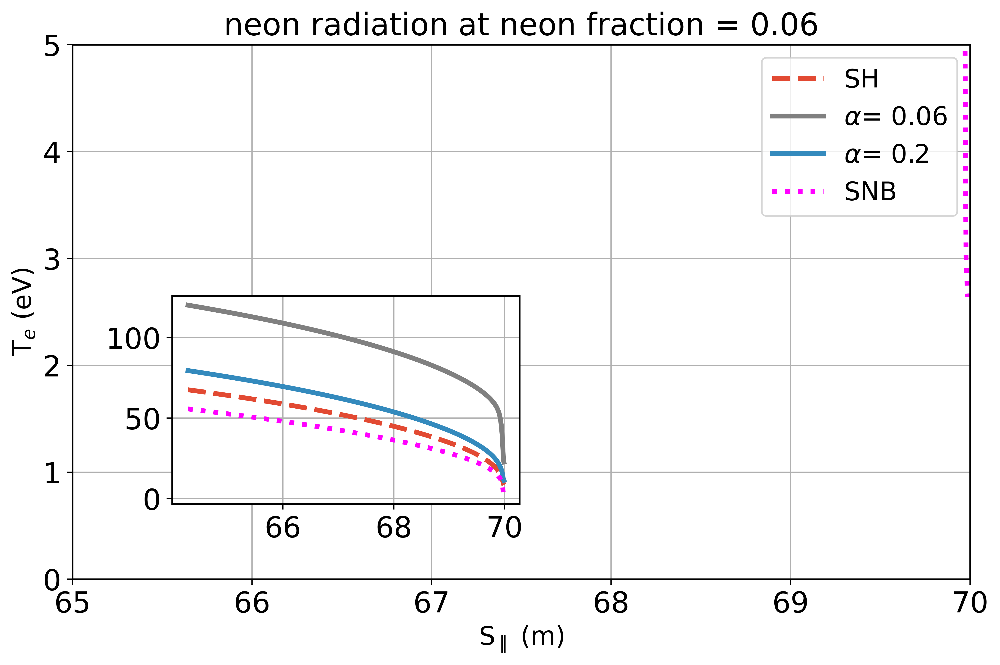

In [3]:
SH_ne0_ds = ds[(ds['alpha'] == 'SH') & (ds['neon_frac'] == 0.0)]

FL02_ne0_ds = ds[(ds['alpha'] == '0.2') & (ds['neon_frac'] == 0.0)]

SNB_ne0_ds = ds[(ds['alpha'] == 'SNB') & (ds['neon_frac'] == 0.0)]


fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)
ax_inset = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)

neon_frac_val =0.06
neon_0_ds = ds[ds['neon_frac'] == neon_frac_val]




for i in neon_0_ds['alpha'].unique():
        if i not in ['0.1','0.4']:  # Exclude plotting for alpha = 'SNB'

            if i == 'SH':
                linestyle = '--'
                label = 'SH'
            elif i == 'SNB':
                linestyle = ':'
                label = 'SNB'
            else:
                linestyle = '-'
                label = r'$\alpha$' + f'= {i}'

            ax.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == neon_frac_val)]['y'], neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == neon_frac_val)]['Te'], 
                    label=label, linewidth=linewidth, markersize=markersize, color = colors[i], linestyle = linestyle)
            ax_inset.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == neon_frac_val)]['y'][-200:], neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == neon_frac_val)]['Te'][-200:], 
            label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize,color = colors[i], linestyle = linestyle)

# # Get handles and labels
# handles, labels = plt.gca().get_legend_handles_labels()

# # Desired order (SH, 0.2, 0.06)
# order = [0, 2, 1, 3]

# # Reorder handles and labels
# handles = [handles[i] for i in order]
# labels = [labels[i] for i in order]


ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'T$_e$ (eV)')
# ax.set_ylabel(r'R$_{neon}$ (Wm$^3$)')
ax.set_title(f'neon radiation at neon fraction = {neon_frac_val}')
# ax.legend(handles, labels, loc = 'upper right')
ax.set_xlim(65, 70)
ax.set_ylim(0, 5)
ax.legend(loc = 'upper right')

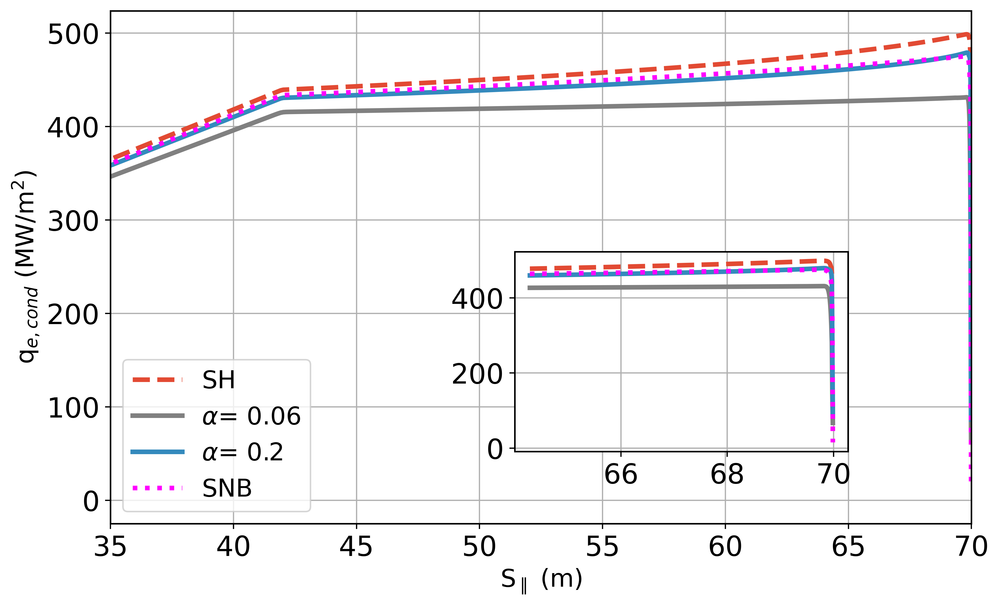

In [4]:
# Heat flux plot

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)
ax_inset = inset_axes(ax, width="30%", height="30%", loc='lower right',bbox_to_anchor=(-0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)


neon_0_ds = ds[ds['neon_frac'] == 0.0]


for i in neon_0_ds['alpha'].unique():
        ds_i = neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]
        if i not in ['0.1','0.4']:  # Exclude plotting for alpha = 'SNB'
            if i == 'SH':
                linestyle = '--'
                q = spitzer_q_electron_simple(ds_i) * 1e-8
                label = 'SH'
            elif i == 'SNB':
                linestyle = ':'
                q = divq_integrate(ds_i, snb_int=True) * 1e-6
                label = 'SNB'   
            else:
                linestyle = '-'
                q = spitzer_q_electron_simple(ds_i)* 1e-8 
                label = r'$\alpha$' + f'= {i}'
                
            ax.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['y'], q, 
                    label=label, linewidth=linewidth, markersize=markersize, color = colors[i], linestyle = linestyle)
            ax_inset.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['y'][-200:], q[-200:], 
            label=label, linewidth=linewidth, markersize=markersize,color = colors[i], linestyle = linestyle)

# # Get handles and labels
# handles, labels = plt.gca().get_legend_handles_labels()

# # Desired order (SH, 0.2, 0.06)
# order = [0, 2, 1, 3]

# # Reorder handles and labels
# handles = [handles[i] for i in order]
# labels = [labels[i] for i in order]


ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'q$_{e,cond}$ (MW/m$^2$)')
ax.set_xbound(35,70.0001)
# ax.set_xbound(65,70.0001)
# ax[2].set_ybound(0, 0.1e11)
ax.legend( loc='lower left')

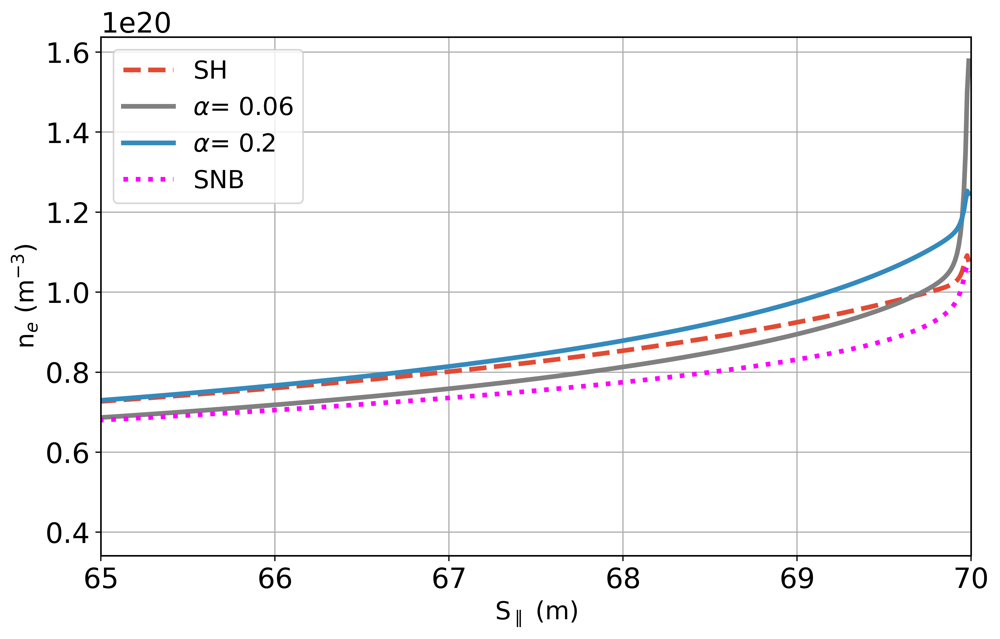

In [5]:
# ne

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)
# ax_inset = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)


neon_0_ds = ds[ds['neon_frac'] == 0.0]


for i in neon_0_ds['alpha'].unique():
        if i not in ['0.1','0.4']:  # Exclude plotting for alpha = 'SNB'

            if i == 'SH':
                linestyle = '--'
                label = 'SH'
            elif i == 'SNB':
                linestyle = ':'
                label = 'SNB'
            else:
                linestyle = '-'
                label = r'$\alpha$' + f'= {i}'

            ax.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['y'], neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['Ne'], 
                    label=label, linewidth=linewidth, markersize=markersize, color = colors[i], linestyle = linestyle)
#             ax_inset.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['y'][-200:], neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['Te'][-200:], 
#             label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize,color = colors[i], linestyle = linestyle)

# # # Get handles and labels
# handles, labels = plt.gca().get_legend_handles_labels()

# # Desired order (SH, 0.2, 0.06)
# order = [0, 2, 1, 3]

# # Reorder handles and labels
# handles = [handles[i] for i in order]
# labels = [labels[i] for i in order]

ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'n$_e$ (m$^{-3}$)')
# ax.set_yscale('log')
# ax.set_yticks([1e19, 1e20, 1e21])
ax.set_xbound(65,70.0001)
ax.legend( loc='upper left')

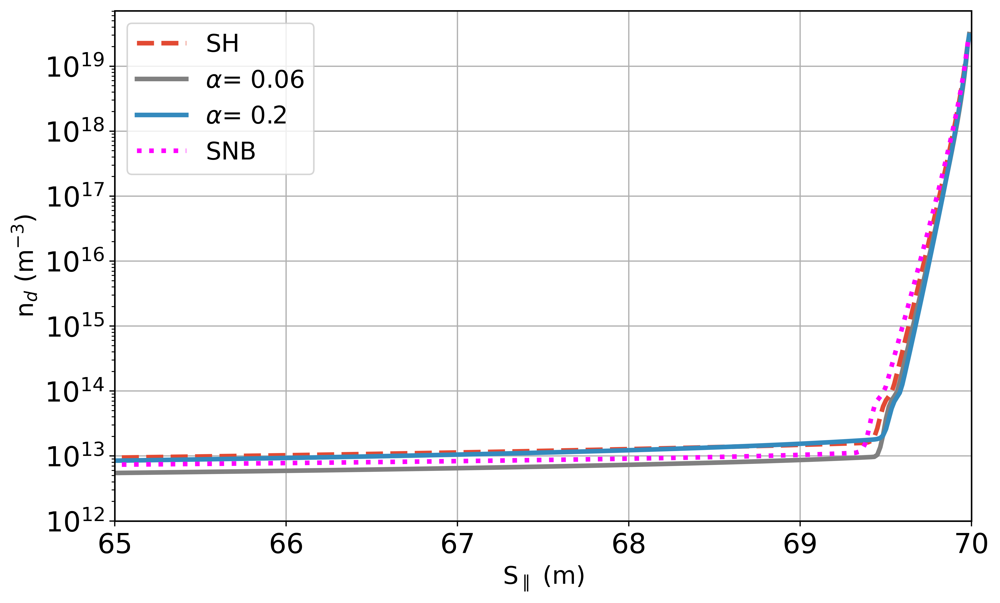

In [6]:
#nd

# ne

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)
# ax_inset = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)


neon_0_ds = ds[ds['neon_frac'] == 0.0]


for i in neon_0_ds['alpha'].unique():
        if i not in ['0.1','0.4']:  # Exclude plotting for alpha = 'SNB'

            if i == 'SH':
                linestyle = '--'
                label = 'SH'
            elif i == 'SNB':
                linestyle = ':'
                label = 'SNB'
            else:
                linestyle = '-'
                label = r'$\alpha$' + f'= {i}'

            ax.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['y'], neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['Nd'], 
                    label=label, linewidth=linewidth, markersize=markersize, color = colors[i], linestyle = linestyle)
#             ax_inset.plot(neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['y'][-200:], neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]['Te'][-200:], 
#             label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize,color = colors[i], linestyle = linestyle)

# # # Get handles and labels
# handles, labels = plt.gca().get_legend_handles_labels()

# # Desired order (SH, 0.2, 0.06)
# order = [0, 2, 1, 3]

# # Reorder handles and labels
# handles = [handles[i] for i in order]
# labels = [labels[i] for i in order]

ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'n$_d$ (m$^{-3}$)')
ax.set_yscale('log')
ax.set_xbound(65,70.0001)
ax.legend(loc='upper left')

In [7]:


SNB_ne0_ds = ds[(ds['alpha'] == 'SNB') & (ds['neon_frac'] == 0.0)]


print((divq_integrate(SNB_ne0_ds, snb_int=True)))

[0.00000000e+00 1.71132903e+06 3.42033044e+06 5.12758981e+06
 6.83287883e+06 8.53612582e+06 1.02373513e+07 1.19365511e+07
 1.36337268e+07 1.53288821e+07 1.70220142e+07 1.87131252e+07
 2.04022161e+07 2.20892854e+07 2.37743361e+07 2.54573698e+07
 2.71383873e+07 2.88173888e+07 3.04943747e+07 3.21693482e+07
 3.38423073e+07 3.55132534e+07 3.71821880e+07 3.88491087e+07
 4.05140185e+07 4.21769208e+07 4.38378181e+07 4.54967093e+07
 4.71535933e+07 4.88084695e+07 5.04613379e+07 5.21122003e+07
 5.37610583e+07 5.54079112e+07 5.70527611e+07 5.86956108e+07
 6.03364609e+07 6.19753118e+07 6.36121641e+07 6.52470176e+07
 6.68798725e+07 6.85107288e+07 7.01395869e+07 7.17664460e+07
 7.33913075e+07 7.50141755e+07 7.66350519e+07 7.82539358e+07
 7.98708277e+07 8.14857273e+07 8.30986356e+07 8.47095551e+07
 8.63184859e+07 8.79254261e+07 8.95303748e+07 9.11333345e+07
 9.27343075e+07 9.43332939e+07 9.59302926e+07 9.75253049e+07
 9.91183330e+07 1.00709379e+08 1.02298441e+08 1.03885523e+08
 1.05470620e+08 1.070537

SH
0.06
0.2
SNB


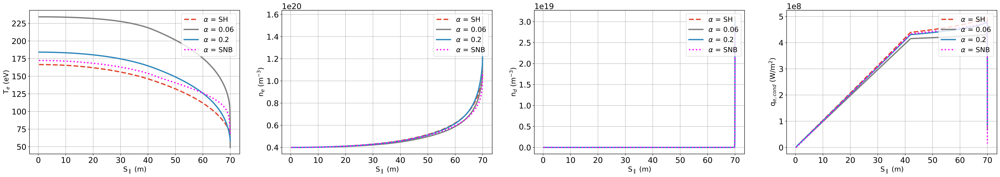

In [8]:
fig, ax = plt.subplots(1, 4, figsize=(40, 6), dpi=500)
# ax_inset[0] = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)

neon_0_ds = ds[ds['neon_frac'] == 0.0]

for i in neon_0_ds['alpha'].unique():
    ds_i = neon_0_ds[(neon_0_ds['alpha'] == i) & (neon_0_ds['neon_frac'] == 0.0)]
    
    if i not in ['0.1', '0.4']:  # Exclude plotting for alpha = 'SNB'
        print(i)
        if i == 'SH':
            linestyle = '--'
            q = spitzer_q_electron_simple(ds_i) * 1e-2
            
        elif i == 'SNB':
            linestyle = ':'
            q = divq_integrate(ds_i, snb_int=True)
        else:
            linestyle = '-'
            q = spitzer_q_electron_simple(ds_i)* 1e-2

        ax[0].plot(ds_i['y'], ds_i['Te'],
                   label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[1].plot(ds_i['y'], ds_i['Ne'],
                   label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[3].plot(ds_i['y'], q,
                   label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[2].plot(ds_i['y'], ds_i['Nd'], label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)


ax[0].set_xlabel(r'S$_\parallel$ (m)')
ax[0].set_ylabel(r'T$_e$ (eV)')
ax[0].legend(loc='upper right')

ax[1].set_xlabel(r'S$_\parallel$ (m)')
ax[1].set_ylabel(r'n$_e$ (m$^{-3}$)')
ax[1].legend( loc='upper right')

ax[3].set_xlabel(r'S$_\parallel$ (m)')
ax[3].set_ylabel(r'q$_{e,cond}$ (W/m$^2$)')
# ax[2].set_xbound(35,70)
# ax[2].set_ybound(0, 0.1e11)
ax[3].legend( loc='upper right')

ax[2].set_xlabel(r'S$_\parallel$ (m)')
ax[2].set_ylabel(r'n$_d$ (m$^{-3}$)')
ax[2].legend(loc='upper right')




plt.show()



SH
0.06
0.2
SNB


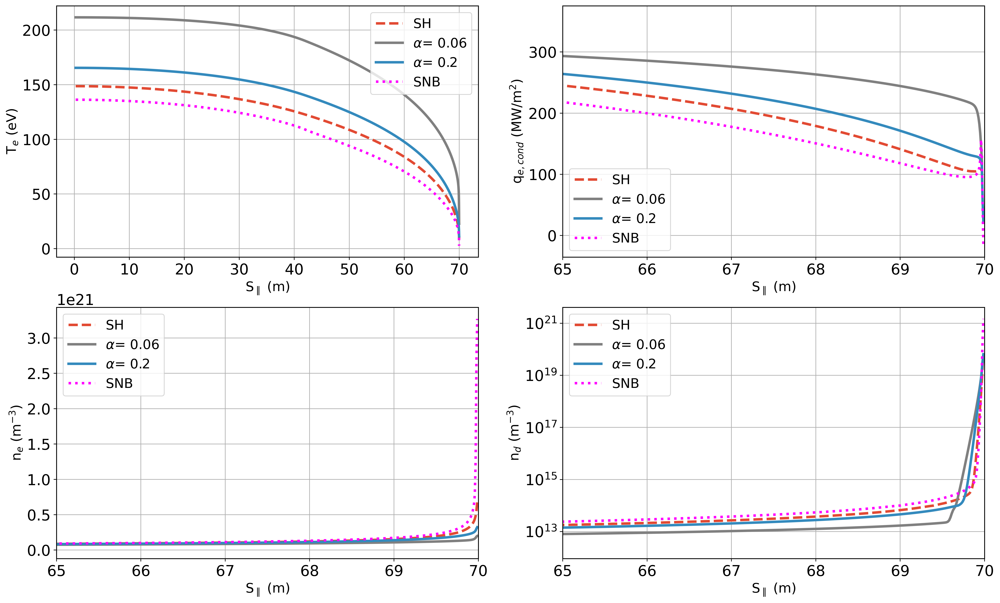

In [9]:
fig, ax = plt.subplots(2, 2, figsize=(20, 12), dpi=500)
# ax_inset[0] = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)

neon_0_ds = ds[ds['neon_frac'] == 0.0]

for i in neon_0_ds['alpha'].unique():
    ds_i = ds[(ds['alpha'] == i) & (ds['neon_frac'] == 0.06)]
    
    if i not in ['0.1', '0.4']:  # Exclude plotting for alpha = 'SNB'
        print(i)
        if i == 'SH':
            linestyle = '--'
            q = spitzer_q_electron_simple(ds_i) * 1e-8
            label = 'SH'
        elif i == 'SNB':
            linestyle = ':'
            q = divq_integrate(ds_i, snb_int=True) * 1e-6
            label = 'SNB'
        else:
            linestyle = '-'
            q = spitzer_q_electron_simple(ds_i)* 1e-8
            label = r'$\alpha$' + f'= {i}'

        ax[0,0].plot(ds_i['y'], ds_i['Te'],
                   label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[0,1].plot(ds_i['y'], q,
            label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[1,0].plot(ds_i['y'], ds_i['Ne'],
                   label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        
        ax[1,1].plot(ds_i['y'], ds_i['Nd'], label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)



# # Desired order (SH, 0.2, 0.06)
# order = [0, 2, 1, 3]

# # Reorder handles and labels
# handles = [handles[i] for i in order]
# labels = [labels[i] for i in order]

ax[0,0].set_xlabel(r'S$_\parallel$ (m)')
ax[0,0].set_ylabel(r'T$_e$ (eV)')
# ax[0,0].set_xbound(65,70.0001)
ax[0,0].legend(loc='upper right')


ax[0,1].set_xlabel(r'S$_\parallel$ (m)')
ax[0,1].set_ylabel(r'q$_{e,cond}$ (MW/m$^2$)')
ax[0,1].set_xbound(35,70.0001)
ax[0,1].set_xbound(65,70.0001)
# ax[2].set_ybound(0, 0.1e11)
ax[0,1].legend( loc='lower left')

ax[1,0].set_xlabel(r'S$_\parallel$ (m)')
ax[1,0].set_ylabel(r'n$_e$ (m$^{-3}$)')
# ax[1,0].set_yscale('log')
ax[1,0].set_xbound(65,70.0001)
ax[1,0].legend( loc='upper left')


ax[1,1].set_xlabel(r'S$_\parallel$ (m)')
ax[1,1].set_ylabel(r'n$_d$ (m$^{-3}$)')
ax[1,1].set_yscale('log')
ax[1,1].set_xbound(65,70.0001)
ax[1,1].legend(loc='upper left')




plt.show()



SH
0.06
0.2
SNB


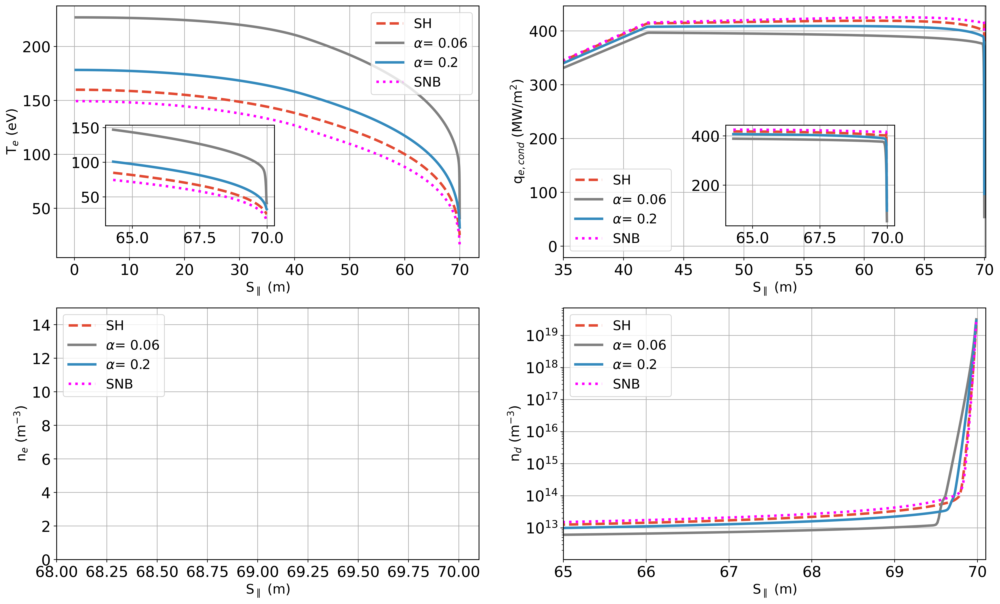

In [10]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(20, 12), dpi=500)

# Create inset axes for the first subplot
ax_inset = inset_axes(ax[0, 0], width="40%", height="40%", loc='lower left',
                      bbox_to_anchor=(0.1, 0.1, 1, 1), bbox_transform=ax[0, 0].transAxes)

ax_inset_flux = inset_axes(ax[0, 1], width="40%", height="40%", loc='lower right',
                      bbox_to_anchor=(-0.2, 0.1, 1, 1), bbox_transform=ax[0, 1].transAxes)

neon_0_ds = ds[ds['neon_frac'] == 0.0]

for i in neon_0_ds['alpha'].unique():
    ds_i = ds[(ds['alpha'] == i) & (ds['neon_frac'] == 0.02)]
    
    if i not in ['0.1', '0.4']:  # Exclude plotting for alpha = 'SNB'
        print(i)
        if i == 'SH':
            linestyle = '--'
            q = spitzer_q_electron_simple(ds_i) * 1e-8
            label = 'SH'
        elif i == 'SNB':
            linestyle = ':'
            q = divq_integrate(ds_i, snb_int=True) * 1e-6
            label = 'SNB'
        else:
            linestyle = '-'
            q = spitzer_q_electron_simple(ds_i)* 1e-8
            label = r'$\alpha$' + f'= {i}'

        ax[0, 0].plot(ds_i['y'], ds_i['Te'],
                      label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        ax_inset.plot(ds_i['y'][-200:], ds_i['Te'][-200:], 
                      label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[0, 1].plot(ds_i['y'], q,
                      label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        ax_inset_flux.plot(ds_i['y'][-200:], q[-200:],
                        label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[1,0].plot(ds_i['y'], ds_i['Td+'],
                   label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[1, 1].plot(ds_i['y'], ds_i['Nd'],
                      label=label, linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)

# Setting labels and legends
ax[0, 0].set_xlabel(r'S$_\parallel$ (m)')
ax[0, 0].set_ylabel(r'T$_e$ (eV)')
ax[1, 0].set_xbound(68, 70.1)
ax[1, 0].set_ybound(0,15)
ax[0, 0].legend(loc='upper right')

ax[0, 1].set_xlabel(r'S$_\parallel$ (m)')
ax[0, 1].set_ylabel(r'q$_{e,cond}$ (MW/m$^2$)')
ax[0, 1].set_xbound(35, 70.1)
ax[0, 1].legend(loc='lower left')

ax[1, 0].set_xlabel(r'S$_\parallel$ (m)')
ax[1, 0].set_ylabel(r'n$_e$ (m$^{-3}$)')
# ax[1, 0].set_yscale('log')
# ax[1, 0].set_xbound(65, 70.1)
ax[1, 0].legend(loc='upper left')

ax[1, 1].set_xlabel(r'S$_\parallel$ (m)')
ax[1, 1].set_ylabel(r'n$_d$ (m$^{-3}$)')
ax[1, 1].set_yscale('log')
ax[1, 1].set_xbound(65, 70.1)
ax[1, 1].legend(loc='upper left')

plt.show()



In [11]:
neon_fraction = 0.0

SH_ne0_ds = ds[(ds['alpha'] == 'SH') & (ds['neon_frac'] == neon_fraction)]

FL02_ne0_ds = ds[(ds['alpha'] == '0.2') & (ds['neon_frac'] == neon_fraction)]

FL006_ne0_ds = ds[(ds['alpha'] == '0.06') & (ds['neon_frac'] == neon_fraction)]

SNB_ne0_ds = ds[(ds['alpha'] == 'SNB') & (ds['neon_frac'] == neon_fraction)]

# Target ne
SH_ne = SH_ne0_ds['Ne'][-1:].values
FL02_ne = FL02_ne0_ds['Ne'][-1:].values
FL006_ne = FL006_ne0_ds['Ne'][-1:].values
SNB_ne = SNB_ne0_ds['Ne'][-1:].values

print('SH ne = ', SH_ne)
print('FL02 ne = ', FL02_ne)
print('FL006 ne = ', FL006_ne)
print('SNB ne = ', SNB_ne)

# print('difference between SH and FL02 ne = ', f'{(FL02_ne/SH_ne)*100}%')

# Target temps
SH_Te = SH_ne0_ds['Te'][-1:].values
FL02_Te = FL02_ne0_ds['Te'][-1:].values
FL006_Te = FL006_ne0_ds['Te'][-1:].values
SNB_Te = SNB_ne0_ds['Te'][-1:].values

print('SH Te = ', SH_Te)
print('FL02 Te = ', FL02_Te)
print('FL006 Te = ', FL006_Te)
print('SNB Te = ', SNB_Te)

# print('difference between SH and FL02 Te = ', f'{(FL006_Te/SH_Te)*100}%')

SH ne =  [1.07552481e+20]
FL02 ne =  [1.24595981e+20]
FL006 ne =  [1.57834227e+20]
SNB ne =  [1.04946497e+20]
SH Te =  [70.33415095]
FL02 Te =  [59.10470698]
FL006 Te =  [48.99449372]
SNB Te =  [67.78613574]


SH
0.06
0.2
SNB


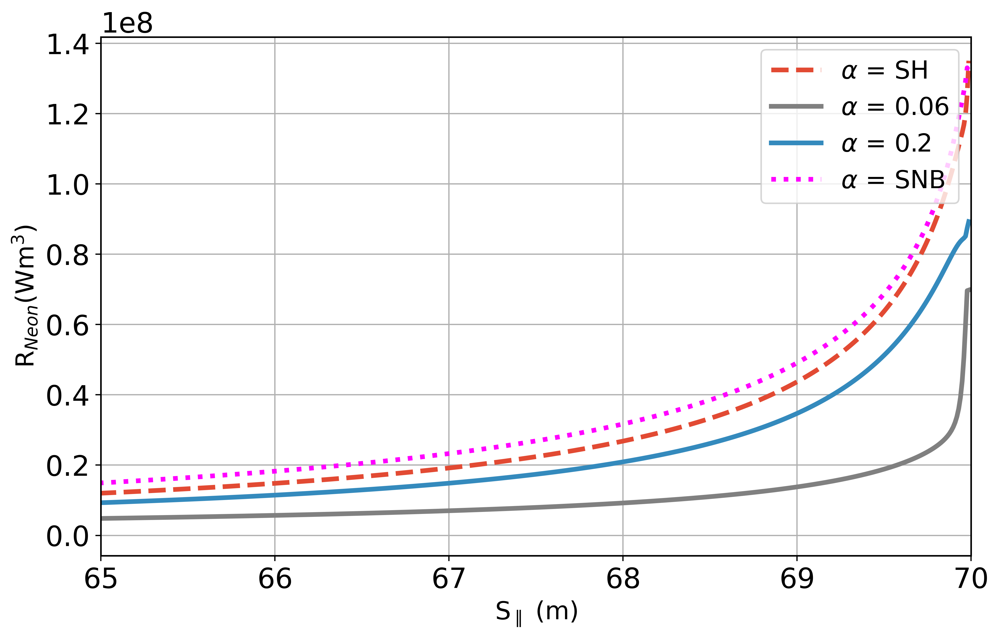

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=500)
# ax_inset[0] = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)

neon_0_ds = ds[ds['neon_frac'] == 0.0]

for i in neon_0_ds['alpha'].unique():
    ds_i = ds[(ds['alpha'] == i) & (ds['neon_frac'] == 0.04)]
    
    if i not in ['0.1', '0.4']:  # Exclude plotting for alpha = 'SNB'
        print(i)
        if i == 'SH':
            linestyle = '--'
            q = spitzer_q_electron_simple(ds_i) * 1e-8
        elif i == 'SNB':
            linestyle = ':'
            q = divq_integrate(ds_i, snb_int=True) * 1e-6
        else:
            linestyle = '-'
            q = spitzer_q_electron_simple(ds_i)* 1e-8

        ax.plot(ds_i['y'], ds_i['Rneon'],
                   label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)


ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'R$_{Neon}$(Wm$^3$)')
ax.set_xbound(65,70.0001)
ax.legend(loc='upper right')




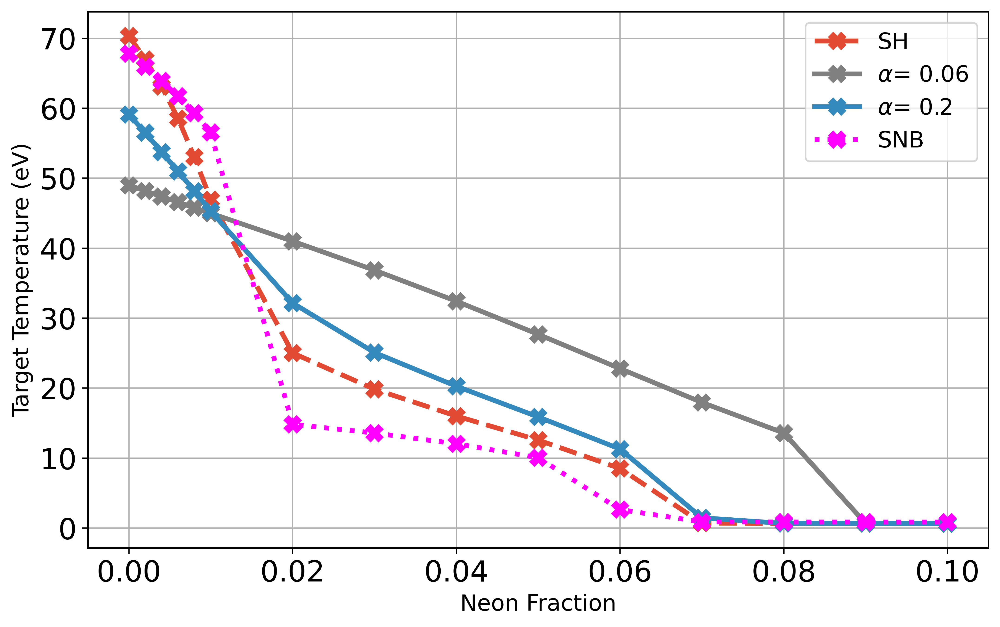

In [13]:
# plt.style.use('ggplot')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams.update({'font.size': 14})
markersize = 10

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)

# print(ds['alpha'].unique())

for i in ds['alpha'].unique():
    if i not in ['0.1','0.4']:  # Exclude plotting for alpha = 'SNB'
        target_temp_list = []
        target_pcle_flux_list = []
        neon_frac_list = []
        df_alpha = ds[ds['alpha'] == f'{i}']
        if i == 'SH':
            linestyle = '--'
            label = 'SH'
        elif i == 'SNB':
            linestyle = ':'
            label = 'SNB'
        else:
            linestyle = '-'
            label = r'$\alpha$' + f'= {i}'
        for j in df_alpha['neon_frac'].unique():
            # print(df_alpha['neon_frac'].unique())
            if j < 0.11:

                try:
                    target_pcle_flux = (df_alpha[(df_alpha['alpha'] == i) & (df_alpha['neon_frac'] == j)]['Vd+'].values[-1] *
                                        df_alpha[(df_alpha['alpha'] == i) & (df_alpha['neon_frac'] == j)]['Nd+'].values[-1])
                    target_pcle_flux_list.append(target_pcle_flux)

                    target_temp_list.append(ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['target_temp'].values[-1])
                except:
                    continue
                neon_frac_list.append(j)
        # print(i, target_temp_list)
        # print(neon_frac_list)


        ax.plot(neon_frac_list, target_temp_list, linewidth=linewidth, markersize=markersize,marker='X', label=label, color = colors[i], linestyle = linestyle)




ax.set_xlabel('Neon Fraction')
ax.set_ylabel('Target Temperature (eV)')

# Set the outline color to black
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['right'].set_color('black')


plt.legend()

# R_neon

/tmp/ipykernel_116967/120277646.py:4: RuntimeWarning: divide by zero encountered in log
  logT = np.log(Te)


88
44.04404404404405


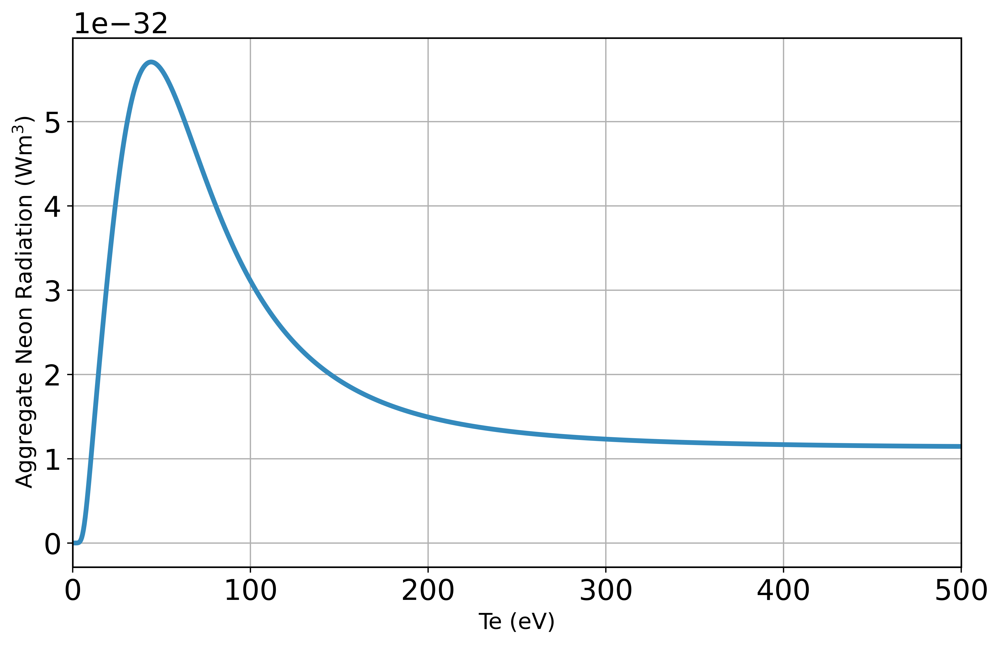

In [14]:
import numpy as np

def neon_adas_curve(Te):
    logT = np.log(Te)
    log_out = np.zeros_like(Te)

    # Coefficients for the polynomial part
    coefficients = np.array([
        -8.21475117e+01, 1.28929854e+01, -4.74266289e+01,
         7.45222324e+01, -5.75710722e+01, 2.57375965e+01,
        -7.12758563e+00, 1.24287546e+00, -1.32943407e-01,
         7.97368445e-03, -2.05487897e-04
    ])

    # Valid temperature range for the polynomial
    valid_mask = (Te >= 2) & (Te <= 1000)
    below_mask = Te < 2
    above_mask = Te > 1000

    # Apply the polynomial coefficients
    for i, coeff in enumerate(coefficients):
        log_out[valid_mask] += coeff * logT[valid_mask] ** i
    
    # Apply the exponential to the valid range
    log_out[valid_mask] = np.exp(log_out[valid_mask])
    
    # Assign the constant values outside the valid temperature range
    log_out[below_mask] = 6.35304113e-36
    log_out[above_mask] = 1.17894628e-32

    return log_out

# Example usage with an array of temperatures:
Te_array = np.array([1.0, 5.0, 10.0, 100.0, 500.0, 1500.0])
output_values = neon_adas_curve(Te_array)
# print(output_values)


# Use this updated Neon_adas class to create the color map and overlay it onto the plot

Te = np.linspace(0, 500, 1000)  # Example temperature value
result = neon_adas_curve(Te)

fig,axis = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)

max_index = np.argmax(result)
print(max_index)

print(Te[max_index])

axis.plot(Te, result, label='Neon ADAS Curve', linewidth=linewidth, color = '#348ABD')
axis.set_xlabel('Te (eV)')
axis.set_ylabel(r'Aggregate Neon Radiation (Wm$^{3}$)')
axis.set_xbound(0, 500)
# axis.set_yscale('log')
# axis.set_xbound(0,200)

SH
0.06
0.2
SNB


/tmp/ipykernel_116967/120277646.py:4: RuntimeWarning: divide by zero encountered in log
  logT = np.log(Te)


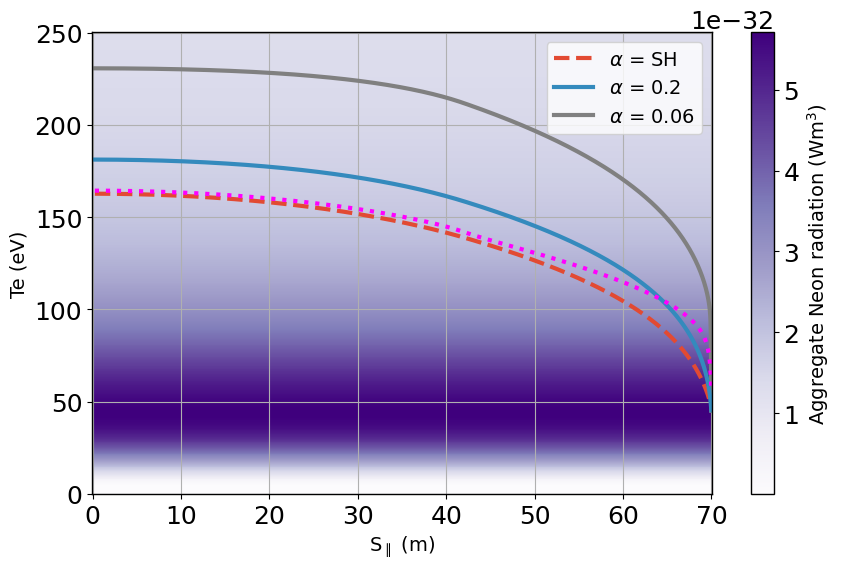

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Assuming the Neon_adas class is defined as in the previous discussion


# Sample data from the plot
# Replace these with the actual data


# Plot the colormap
fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(10, 6))


# Overlay the original line data
# Replace 'alpha_line_data' and 'sh_line_data' with your actual line data
# For example:

for i in ds['alpha'].unique():
    if i == 'SH':
        linestyle = '--'
    elif i == 'SNB':
        linestyle = ':'
    else:
        linestyle = '-'
    for j in ds['neon_frac'].unique():
        if i not in ['0.1', '0.4']:  # Exclude alpha values of 0.1 and 0.4
            if j == 0.01:
                print(i)
                ax.plot(ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['y'], ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te'], 
                        label=r'$\alpha$' + f' = {i}', color=colors[i], linewidth=3, markersize=15, linestyle = linestyle)



S_II = np.linspace(0, 70, 500)  # Spatial coordinate
T_e = np.linspace(0, 250, 500)  # Electron temperature

# Create a meshgrid for S_II and T_e
S_II_grid, T_e_grid = np.meshgrid(S_II, T_e)

# Evaluate the curve function on the meshgrid
Z = neon_adas_curve(T_e_grid)

cmap = 'Purples'

norm = Normalize(vmin=np.min(Z), vmax=np.max(Z))
ax.pcolormesh(S_II_grid, T_e_grid, Z, shading='auto', norm=norm, cmap=cmap)
fig.colorbar(label=r'Aggregate Neon radiation (Wm$^{3}$)', mappable=ax.collections[0])


S_II = np.linspace(64, 70, 500)  # Spatial coordinate
T_e = np.linspace(0, 250, 500)  # Electron temperature



# Create a meshgrid for S_II and T_e
S_II_grid, T_e_grid = np.meshgrid(S_II, T_e)
Z = neon_adas_curve(T_e_grid)

norm = Normalize(vmin=np.min(Z), vmax=np.max(Z))
# colorbar.set_cmap('plasma')


# Get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

# Desired order (SH, 0.2, 0.06)
order = [0, 2, 1]

# Reorder handles and labels
handles = [handles[i] for i in order]
labels = [labels[i] for i in order]



# Set labels and title as needed
ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'Te (eV)')
ax.legend(handles, labels, loc = 'upper right')
plt.show()


SH
0.06
0.2
SNB


/tmp/ipykernel_116967/120277646.py:4: RuntimeWarning: divide by zero encountered in log
  logT = np.log(Te)


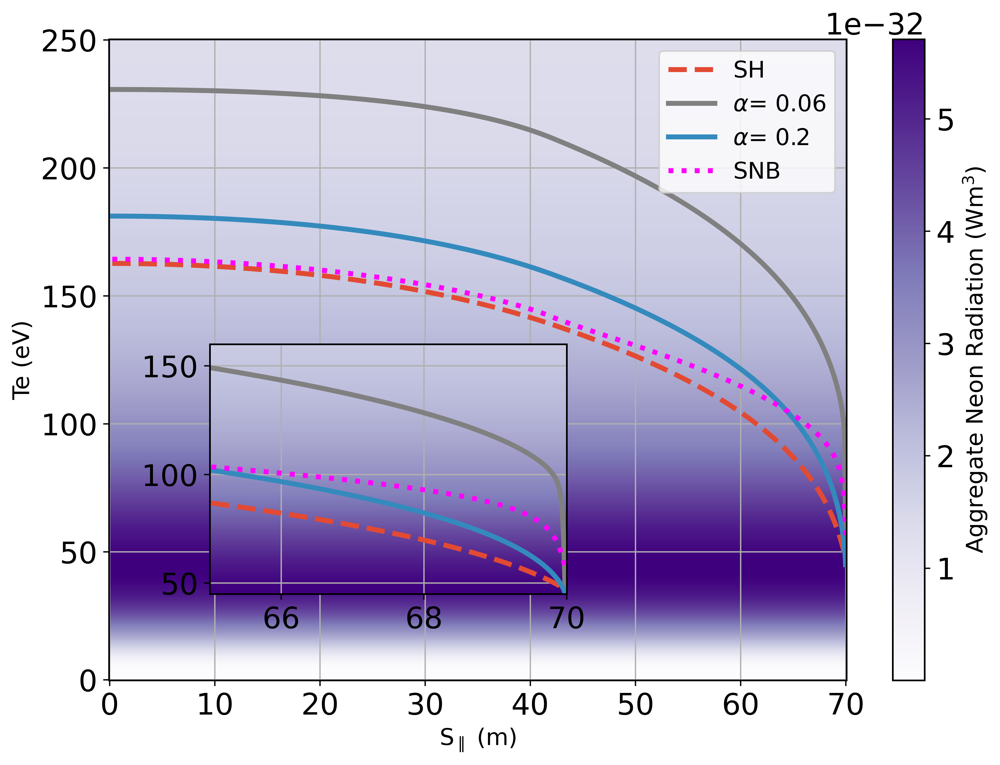

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Assuming the Neon_adas class is defined as in the previous discussion


# Sample data from the plot
# Replace these with the actual data


# Plot the colormap
fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(10, 7), dpi = 500)

ax_inset = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)


# Overlay the original line data
# Replace 'alpha_line_data' and 'sh_line_data' with your actual line data
# For example:

for i in ds['alpha'].unique():
    if i == 'SH':
        linestyle = '--'
        label = 'SH'
    elif i == 'SNB':
        linestyle = ':'
        label = 'SNB'
    else:
        linestyle = '-'
        label = r'$\alpha$' + f'= {i}'
    for j in ds['neon_frac'].unique():
        if i not in ['0.1', '0.4']:  # Exclude alpha values of 0.1 and 0.4
            if j == 0.01:
                print(i)
                ax.plot(ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['y'], ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te'], 
                        label=label, color=colors[i], linewidth=3, markersize=15, linestyle = linestyle)
                ax_inset.plot(ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['y'][-200:], ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te'][-200:], 
                        label=label, color=colors[i], linewidth=3, markersize=15, linestyle = linestyle)


S_II = np.linspace(0, 70, 500)  # Spatial coordinate
T_e = np.linspace(0, 250, 500)  # Electron temperature

# Create a meshgrid for S_II and T_e
S_II_grid, T_e_grid = np.meshgrid(S_II, T_e)

# Evaluate the curve function on the meshgrid
Z = neon_adas_curve(T_e_grid)

cmap = 'Purples'

norm = Normalize(vmin=np.min(Z), vmax=np.max(Z))
ax.pcolormesh(S_II_grid, T_e_grid, Z, shading='auto', norm=norm, cmap=cmap)
fig.colorbar(label=r'Aggregate Neon Radiation (Wm$^{3}$)', mappable=ax.collections[0])


S_II = np.linspace(64, 70, 500)  # Spatial coordinate
T_e = np.linspace(0, 250, 500)  # Electron temperature



# Create a meshgrid for S_II and T_e
S_II_grid, T_e_grid = np.meshgrid(S_II, T_e)
Z = neon_adas_curve(T_e_grid)

norm = Normalize(vmin=np.min(Z), vmax=np.max(Z))

ax_inset.pcolormesh(S_II_grid, T_e_grid, Z, shading='auto', norm=norm, cmap=cmap)
ax_inset.set_xbound(65,70)
ax_inset.set_ybound(45,160)

# colorbar.set_cmap('plasma')


# # Get handles and labels
# handles, labels = plt.gca().get_legend_handles_labels()

# # Desired order (SH, 0.2, 0.06)
# order = [0, 2, 1]

# # Reorder handles and labels
# handles = [handles[i] for i in order]
# labels = [labels[i] for i in order]



# Set labels and title as needed
ax.set_xlabel(r'S$_\parallel$ (m)')
ax.set_ylabel(r'Te (eV)')
# ax.legend(handles, labels, loc = 'upper right')
ax.legend( loc = 'upper right')
plt.show()


# Stefan plot

SH
0.06
0.2
SNB
88
44.04404404404405


/tmp/ipykernel_116967/1996295407.py:4: RuntimeWarning: divide by zero encountered in log
  logT = np.log(Te)


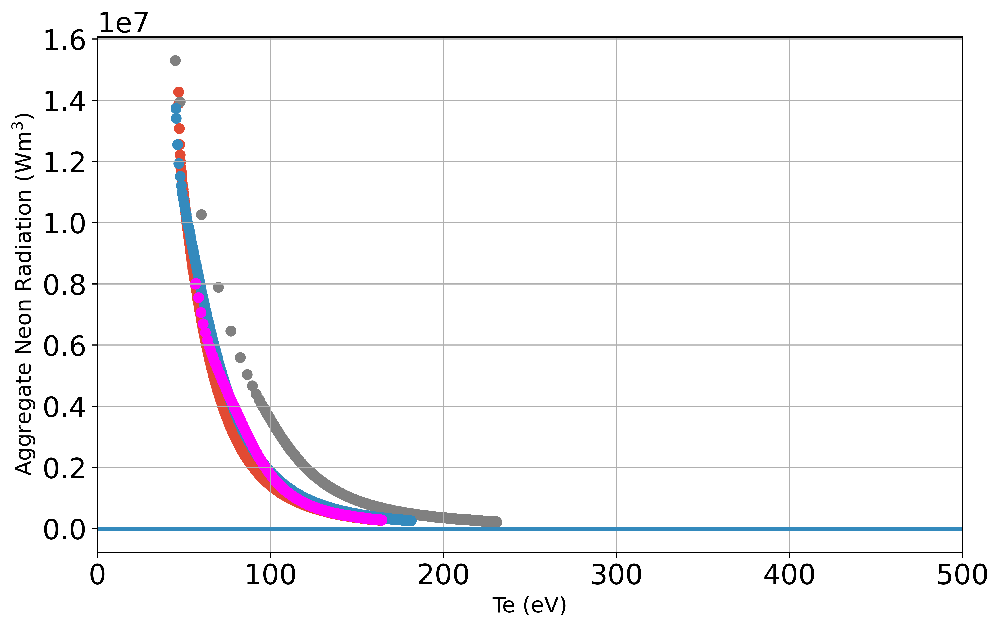

In [17]:
import numpy as np

def neon_adas_curve(Te):
    logT = np.log(Te)
    log_out = np.zeros_like(Te)

    # Coefficients for the polynomial part
    coefficients = np.array([
        -8.21475117e+01, 1.28929854e+01, -4.74266289e+01,
         7.45222324e+01, -5.75710722e+01, 2.57375965e+01,
        -7.12758563e+00, 1.24287546e+00, -1.32943407e-01,
         7.97368445e-03, -2.05487897e-04
    ])

    # Valid temperature range for the polynomial
    valid_mask = (Te >= 2) & (Te <= 1000)
    below_mask = Te < 2
    above_mask = Te > 1000

    # Apply the polynomial coefficients
    for i, coeff in enumerate(coefficients):
        log_out[valid_mask] += coeff * logT[valid_mask] ** i
    
    # Apply the exponential to the valid range
    log_out[valid_mask] = np.exp(log_out[valid_mask])
    
    # Assign the constant values outside the valid temperature range
    log_out[below_mask] = 6.35304113e-36
    log_out[above_mask] = 1.17894628e-32

    return log_out

# Example usage with an array of temperatures:
Te_array = np.array([1.0, 5.0, 10.0, 100.0, 500.0, 1500.0])
output_values = neon_adas_curve(Te_array)
# print(output_values)

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 500)

for i in ds['alpha'].unique():
    if i == 'SH':
        linestyle = '--'
        label = 'SH'
    elif i == 'SNB':
        linestyle = ':'
        label = 'SNB'
    else:
        linestyle = '-'
        label = r'$\alpha$' + f'= {i}'
    for j in ds['neon_frac'].unique():
        if i not in ['0.1', '0.4']:  # Exclude alpha values of 0.1 and 0.4
            if j == 0.01:
                print(i)
                ax.scatter(ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te'], ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Rneon'], 
                        label=label, color=colors[i])
                # ax_inset.plot(ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['y'][-200:], ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te'][-200:], 
                #         label=label, color=colors[i], linewidth=3, markersize=15, linestyle = linestyle)


# Use this updated Neon_adas class to create the color map and overlay it onto the plot

Te = np.linspace(0, 500, 1000)  # Example temperature value
result = neon_adas_curve(Te)



max_index = np.argmax(result)
print(max_index)

print(Te[max_index])

ax.plot(Te, result, label='Neon ADAS Curve', linewidth=linewidth, color = '#348ABD')
ax.set_xlabel('Te (eV)')
ax.set_ylabel(r'Aggregate Neon Radiation (Wm$^{3}$)')
ax.set_xbound(0, 500)
# axis.set_yscale('log')
# axis.set_xbound(0,200)

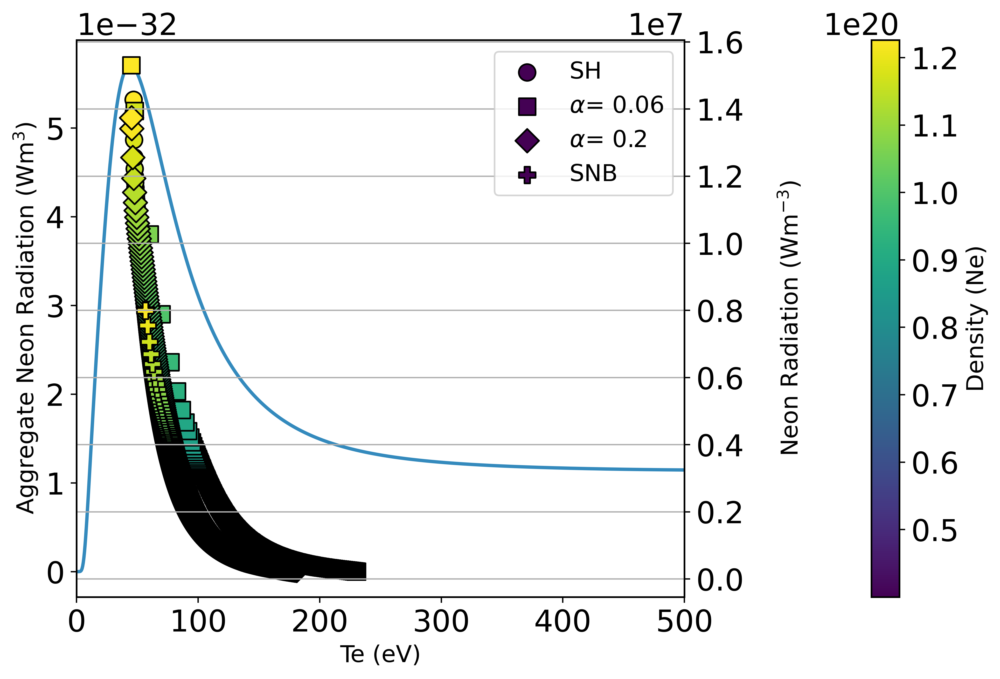

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Define a list of more distinct marker styles
marker_styles = ['o', 's', '^', 'D', 'v', 'P', '*', 'h']  # Hexagon ('h') added

# Assuming Te and result are already computed as in your code above
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=500)

# Plotting the curve
ax.plot(Te, result, label='Neon ADAS Curve', linewidth=2, color='#348ABD')
ax2 = ax.twinx()
# Example scatter plot with enhanced marker styles for each alpha
for idx, i in enumerate(ds['alpha'].unique()):
    if i == 'SH':
        linestyle = '--'
        label = 'SH'
    elif i == 'SNB':
        linestyle = ':'
        label = 'SNB'
    else:
        linestyle = '-'
        label = r'$\alpha$' + f'= {i}'
    
    marker_style = marker_styles[idx % len(marker_styles)]  # Cycle through marker styles

    for j in ds['neon_frac'].unique():
        if i not in ['0.1', '0.4']:  # Exclude alpha values of 0.1 and 0.4
            if j == 0.01:
                Te_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te']
                Rneon_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Rneon']
                Ne_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Ne']

                sc = ax2.scatter(
                    Te_values,
                    Rneon_values,
                    c=Ne_values,  # Color based on 'Ne'
                    cmap='viridis',  # Choose a color map, e.g., 'viridis'
                    label=label,
                    linewidth=1,  # Slightly reduced line width
                    s=100,  # Increased marker size
                    marker=marker_style,  # Use the selected marker style
                    edgecolor='black'  # Add a black edge to the markers
                )

# Final touches on the plot
ax.set_xlabel('Te (eV)')
ax.set_ylabel(r'Aggregate Neon Radiation (Wm$^{3}$)')
ax.set_xbound(0, 500)
ax.grid(False)
ax2.set_ylabel(r'Neon Radiation (Wm$^{-3}$)', labelpad=20)  # Add padding with labelpad
# Add a color bar to the plot
cbar = plt.colorbar(sc, ax=ax, pad=0.2)  # Increase padding
cbar.set_label('Density (Ne)')

plt.legend()
plt.show()


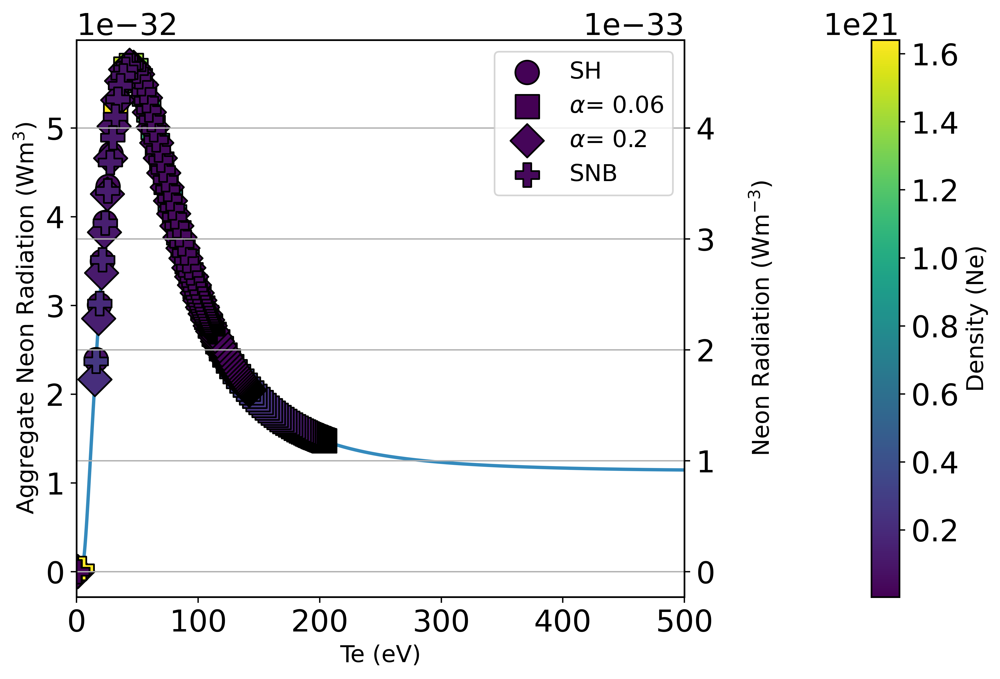

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Define a list of more distinct marker styles
marker_styles = ['o', 's', '^', 'D', 'v', 'P', '*', 'h']  # Hexagon ('h') added

# Assuming Te and result are already computed as in your code above
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=500)

# Create a twin y-axis
ax2 = ax.twinx()

# Plotting the curve
ax.plot(Te, result, label='Neon ADAS Curve', linewidth=2, color='#348ABD')

# Define a downsampling factor (e.g., every 10th point)
downsample_factor = 10

# Example scatter plot with enhanced marker styles for each alpha
for idx, i in enumerate(ds['alpha'].unique()):
    if i == 'SH':
        linestyle = '--'
        label = 'SH'
    elif i == 'SNB':
        linestyle = ':'
        label = 'SNB'
    else:
        linestyle = '-'
        label = r'$\alpha$' + f'= {i}'
    
    marker_style = marker_styles[idx % len(marker_styles)]  # Cycle through marker styles

    for j in ds['neon_frac'].unique():
        if i not in ['0.1', '0.4']:  # Exclude alpha values of 0.1 and 0.4
            if j == 0.08:
                Te_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te']
                Ne_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Ne']
                Rneon_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Rneon']/(Ne_values*Ne_values)
                

                # Downsample the points
                Te_values = Te_values[::downsample_factor]
                Rneon_values = Rneon_values[::downsample_factor]
                Ne_values = Ne_values[::downsample_factor]

                sc = ax2.scatter(
                    Te_values,
                    Rneon_values,
                    c=Ne_values,  # Color based on 'Ne'
                    cmap='viridis',  # Choose a color map, e.g., 'viridis'
                    label=label,
                    linewidth=1,  # Slightly reduced line width
                    s=200,  # Increased marker size
                    marker=marker_style,  # Use the selected marker style
                    edgecolor='black'  # Add a black edge to the markers
                )

# Final touches on the plot
ax.set_xlabel('Te (eV)')
ax.set_ylabel(r'Aggregate Neon Radiation (Wm$^{3}$)')
ax.set_xbound(0, 500)
ax.grid(False)
ax2.set_ylabel(r'Neon Radiation (Wm$^{-3}$)', labelpad=20)  # Add padding with labelpad
# Add a color bar to the plot
cbar = plt.colorbar(sc, ax=ax, pad=0.2)  # Increase padding
cbar.set_label('Density (Ne)')

plt.legend()
plt.show()


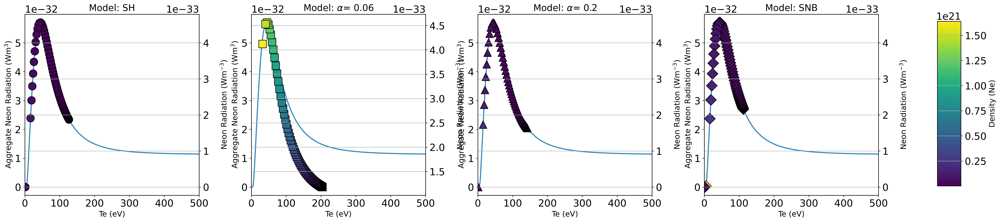

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Define a list of more distinct marker styles
marker_styles = ['o', 's', '^', 'D', 'v', 'P', '*', 'h']  # Hexagon ('h') added

# Assuming Te and result are already computed as in your code above

# Get the unique alpha values excluding 0.1 and 0.4
alpha_values = [i for i in ds['alpha'].unique() if i not in ['0.1', '0.4']]

# Create subplots with as many columns as there are alpha values
fig, axes = plt.subplots(1, len(alpha_values), figsize=(30, 6), dpi=500)

# Plotting the curve and scatter plots on each subplot
for ax, i in zip(axes, alpha_values):
    
    # Create a twin y-axis for each subplot
    ax2 = ax.twinx()
    
    # Plot the main curve in each subplot
    ax.plot(Te, result, label='Neon ADAS Curve', linewidth=2, color='#348ABD')
    
    if i == 'SH':
        linestyle = '--'
        label = 'SH'
    elif i == 'SNB':
        linestyle = ':'
        label = 'SNB'
    else:
        linestyle = '-'
        label = r'$\alpha$' + f'= {i}'
    
    marker_style = marker_styles[alpha_values.index(i) % len(marker_styles)]

    for j in ds['neon_frac'].unique():
        if j == 0.08:
            Te_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Te']
            Ne_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Ne']
            Rneon_values = ds[(ds['alpha'] == i) & (ds['neon_frac'] == j)]['Rneon']/(Ne_values*Ne_values)
            
            # Downsample the points
            Te_values = Te_values[::downsample_factor]
            Rneon_values = Rneon_values[::downsample_factor]
            Ne_values = Ne_values[::downsample_factor]

            sc = ax2.scatter(
                Te_values,
                Rneon_values,
                c=Ne_values,  # Color based on 'Ne'
                cmap='viridis',  # Choose a color map, e.g., 'viridis'
                label=label,
                linewidth=1,  # Slightly reduced line width
                s=200,  # Increased marker size
                marker=marker_style,  # Use the selected marker style
                edgecolor='black'  # Add a black edge to the markers
            )
    
    # Final touches on the subplot
    ax.set_xlabel('Te (eV)')
    ax.set_ylabel(r'Aggregate Neon Radiation (Wm$^{3}$)')
    ax.set_xbound(0, 500)
    ax.grid(False)
    ax2.set_ylabel(r'Neon Radiation (Wm$^{-3}$)', labelpad=20)  # Add padding with labelpad
    ax.set_title(f'Model: {label}')

# Add a color bar to the right of the subplots
fig.subplots_adjust(right=0.85, wspace=0.3)
cbar_ax = fig.add_axes([0.9, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('Density (Ne)')

plt.show()


In [20]:
SH_ds = ds[(ds['alpha'] == 'SH') & (ds['neon_frac'] == 0.05)]

FL02_ds = ds[(ds['alpha'] == '0.2') & (ds['neon_frac'] == 0.05)]

SNB_ds = ds[(ds['alpha'] == 'SNB') & (ds['neon_frac'] == 0.05)]



print(len(SH_ds['Te']))
print(len(SH_ds['Rneon']))

798
798


# Heatflux

SH
0.06
0.2
SNB


Text(0, 0.5, 'q$_{i,cond}$ (MW/m$^2$)')

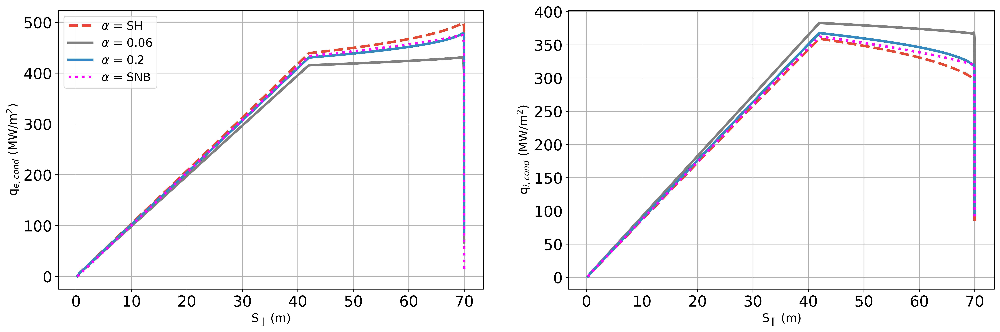

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(20, 6), dpi=500)
# ax_inset[0] = inset_axes(ax, width="30%", height="30%", loc='lower left',bbox_to_anchor=(0.2, 0.2, 1, 1), bbox_transform=fig.transFigure)

neon_0_ds = ds[ds['neon_frac'] == 0.0]

for i in neon_0_ds['alpha'].unique():
    ds_i = ds[(ds['alpha'] == i) & (ds['neon_frac'] == 0.0)]
    
    if i not in ['0.1', '0.4']:  # Exclude plotting for alpha = 'SNB'
        print(i)
        if i == 'SH':
            linestyle = '--'
            q_e = spitzer_q_electron_simple(ds_i) * 1e-8
            q_i = spitzer_q_ion_simple(ds_i) * 1e-8
        elif i == 'SNB':
            linestyle = ':'
            q_e = divq_integrate(ds_i, snb_int=True) * 1e-6
            q_i = spitzer_q_ion_simple(ds_i) * 1e-8
        else:
            linestyle = '-'
            q_e = spitzer_q_electron_simple(ds_i)* 1e-8
            q_i = spitzer_q_ion_simple(ds_i)* 1e-8

        # ax[0,0].plot(ds_i['y'], ds_i['Te'],
        #            label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[0].plot(ds_i['y'], q_e,
            label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        ax[1].plot(ds_i['y'], q_i,
            label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        
        # ax[1,0].plot(ds_i['y'], ds_i['Ne'],
        #            label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)
        
        
        # ax[1,1].plot(ds_i['y'], ds_i['Nd'], label=r'$\alpha$' + f' = {i}', linewidth=linewidth, markersize=markersize, color=colors[i], linestyle=linestyle)


ax[0].set_xlabel(r'S$_\parallel$ (m)')
ax[0].set_ylabel(r'q$_{e,cond}$ (MW/m$^2$)')
ax[0].legend( loc='upper left')

ax[1].set_xlabel(r'S$_\parallel$ (m)')
ax[1].set_ylabel(r'q$_{i,cond}$ (MW/m$^2$)')
# ax[0].set_xbound(35,70.0001)
# ax[2].set_ybound(0, 0.1e11)
# ax[0].legend( loc='lower left')

# Testing effect of constant sheath

In [22]:
# SH_sheath_var = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/updated_flux_limitation/2024-03-25_wigram_reference_glover_comparison_FINAL/alpha_-1/neon_0.0').isel(t= -1)
# SH_sheath_const = xh.open('/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/updated_flux_limitation/simple_sheath_test_2024_07/alpha_-1/neon_0.0').isel(t=-1)